In [1]:
import scanpy as sc
import squidpy as sq
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from tqdm import tqdm

In [2]:
# data_dir = "/data200T/SPACseq/HD/output/subq/outs/binned_outputs/square_002um/"
# gdata = sc.read_h5ad(data_dir + 'combined.h5ad')

data_dir_8um = "/data200T/SPACseq/HD/output/subq/outs/binned_outputs/square_008um/"
gdata_8um = sc.read_h5ad(data_dir_8um + 'combined.h5ad')

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [3]:
count_df = pd.read_csv('./subq_sgNfib_1(1).csv', sep=',', index_col=0)
count_df

,1111
Barcode,
s_008um_00734_00374-1,还有一、
s_008um_00732_00390-1,还有一、
s_008um_00724_00348-1,还有一、
s_008um_00709_00344-1,还有一、
s_008um_00742_00334-1,还有一、
...,...
s_008um_00745_00351-1,还有一、
s_008um_00724_00334-1,还有一、
s_008um_00712_00327-1,还有一、


In [4]:
count_df = pd.DataFrame({
    'gene': gdata.var_names,
    'count': gdata.X.toarray().sum(axis=0).flatten()
}).sort_values(by='count', ascending=False)

In [4]:
from PIL import Image
image = Image.open('/data200T/SPACseq/HD/HE/subQ.btf')
from PIL import ImageFile

ImageFile.LOAD_TRUNCATED_IMAGES = True
Image.MAX_IMAGE_PIXELS = None

scale_factors = {
    '994': 0.13396744,
    '992_1': 0.15574707,
    '992_2': 0.122028105,
    'subq': 0.08734006
}

image.seek(2)
layer = image.copy()
# plt.imshow(layer)

In [5]:
plot_data_8um = gdata_8um[count_df.index].copy()
plot_data_8um.var_names_make_unique()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [6]:
xmin_1, xmax_1 = plot_data_8um.obsm['spatial'][:, 0].min(), plot_data_8um.obsm['spatial'][:, 0].max()
ymin_1, ymax_1 = plot_data_8um.obsm['spatial'][:, 1].min(), plot_data_8um.obsm['spatial'][:, 1].max()

In [14]:
plot_data = gdata[(gdata.obsm['spatial'][:, 0] < xmax_1) & (gdata.obsm['spatial'][:, 0] > xmin_1) & (gdata.obsm['spatial'][:, 1] < ymax_1) & (gdata.obsm['spatial'][:, 1] > ymin_1)].copy()
image_cropped = np.array(layer)[:, layer.size[0] // 2:]
plot_data.var_names_make_unique()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


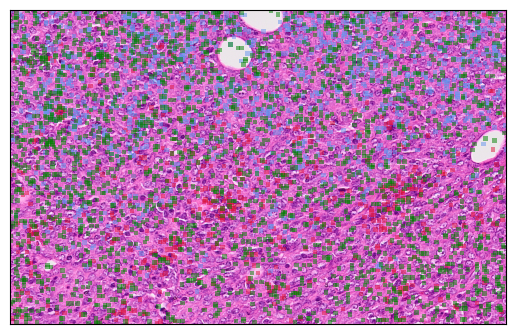

In [11]:
plt.imshow(image_cropped)
trac_data = plot_data[plot_data[:, ['Trac', 'Trbc1', 'Trbc2']].X.toarray().sum(axis=1) > 0]
mag_data = plot_data[plot_data[:, ['sgNfib_1']].X.toarray().flatten() > 0]

mag_genes = ["Mki67", "Epcam", "Top2a", "Ascl2", "Cbx3", "Hsp90ab1", "Zfas1", "Pabpc1", "Gtf3a", "Nap1l1", "Tgfbi", "Ifitm3", "Hspd1", "Nono", "Hsph1", "Nkd1", "Ly6e", "C6orf48", "Ssb", "Rsl1d1", "Dpep1", "Dkc1", "Bmp4", "Gng4", "Cpne1", "Zdhhc9", "Dars", "Scd", "Myc", "Phlda1", "Dach1", "Cldn1", "Krt23"]
mag_genes = np.intersect1d(mag_genes, plot_data.var_names)
sig_data = plot_data[plot_data[:, mag_genes].X.toarray().sum(axis=1) > np.quantile(plot_data[:, mag_genes].X.toarray().sum(axis=1), 0.95)]

sns.scatterplot(x=trac_data.obsm['spatial'][:, 0] - layer.size[0] // 2,
                y=trac_data.obsm['spatial'][:, 1], s=10, edgecolor='none', marker='s', alpha=0.5, c='crimson')
sns.scatterplot(x=mag_data.obsm['spatial'][:, 0] - layer.size[0] // 2,
                y=mag_data.obsm['spatial'][:, 1], s=10, edgecolor='none', marker='s', alpha=0.5, c='cornflowerblue')
sns.scatterplot(x=sig_data.obsm['spatial'][:, 0] - layer.size[0] // 2,
                y=sig_data.obsm['spatial'][:, 1], s=10, edgecolor='none', marker='s', alpha=0.5, c='green')

plt.xlim(xmin_1 - layer.size[0] // 2, xmax_1 - layer.size[0] // 2)
plt.ylim(ymin_1, ymax_1)

plt.gca().invert_yaxis()

plt.xticks([])
plt.yticks([])

plt.savefig('./plots/trac_mag.pdf', dpi=300, bbox_inches='tight', format='pdf')
plt.show()

In [ ]:
mag_genes = ["Mki67", "Epcam", "Top2a", "Ascl2", "Cbx3", "Hsp90ab1", "Zfas1", "Pabpc1", "Gtf3a", "Nap1l1", "Tgfbi", "Ifitm3", "Hspd1", "Nono", "Hsph1", "Nkd1", "Ly6e", "C6orf48", "Ssb", "Rsl1d1", "Dpep1", "Dkc1", "Bmp4", "Gng4", "Cpne1", "Zdhhc9", "Dars", "Scd", "Myc", "Phlda1", "Dach1", "Cldn1", "Krt23"]
mag_genes = np.intersect1d(mag_genes, plot_data.var_names)

for gene in mag_genes:
    pdata = plot_data[plot_data[:, gene].X.toarray().flatten() > 0]
    sns.scatterplot(x=pdata.obsm['spatial'][:, 0] - layer.size[0] // 2,
                    y=pdata.obsm['spatial'][:, 1], s=10, edgecolor='none', marker='s', alpha=0.5, c='cornflowerblue')
    plt.show()

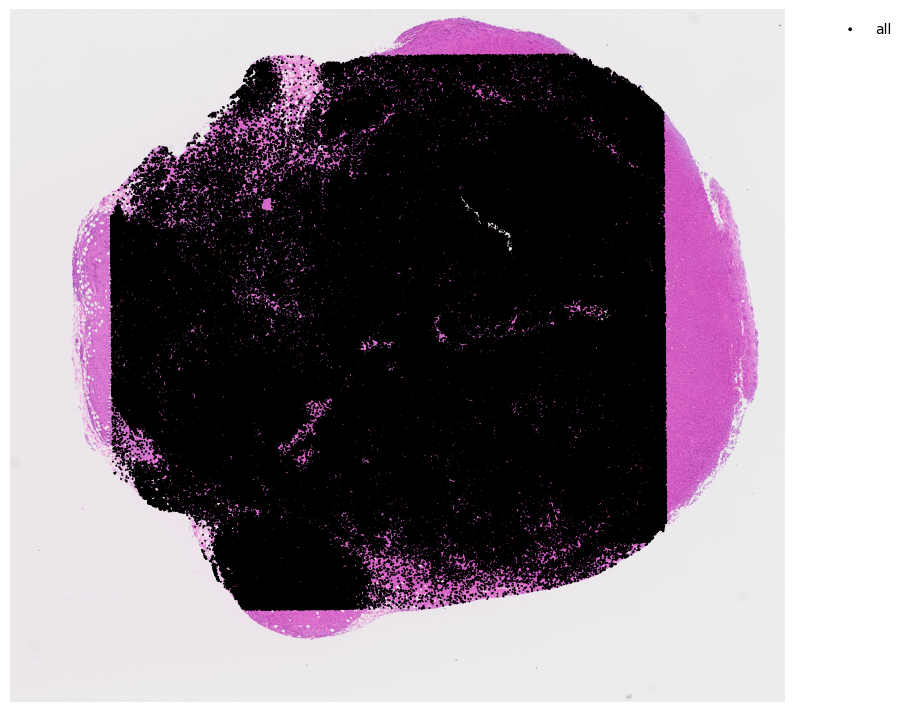

In [11]:
mask = gdata.X.toarray().sum(axis=1) > 0
plot_data = gdata[mask, :].copy()

_, ax = plt.subplots(figsize=(10, 10))
image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped)

sns.scatterplot(x=plot_data.obsm['spatial'][:, 0] * scale_factors['subq'] - image.shape[1] // 2,
                y=plot_data.obsm['spatial'][:, 1] * scale_factors['subq'],
                s=plot_data.X.toarray().sum(axis=1).flatten() * 2, color='black', label='all', edgecolor='none')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, ncol=2)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

In [ ]:
from PIL import Image
import numpy as np

# image = Image.open('/data200T/SPACseq/HD/output/subq/outs/binned_outputs/square_008um/spatial/tissue_hires_image.png')

data_dir_8um = "/data200T/SPACseq/HD/output/subq/outs/binned_outputs/square_008um/"
gdata_8um = sc.read_h5ad(data_dir_8um + 'guide_combined.h5ad')

mask = gdata_8um.X.toarray().sum(axis=1) > 0
plot_data = gdata_8um[mask, :].copy()

scale_factors = {
    '994': 0.13396744,
    '992_1': 0.15574707,
    '992_2': 0.122028105,
    'subq': 0.08734006
}

count_df = pd.DataFrame({
    'gene': gdata_8um.var_names,
    'count': gdata_8um.X.toarray().sum(axis=0).flatten()
}).sort_values(by='count', ascending=False)

_, ax = plt.subplots(figsize=(10, 10))
colors = plt.cm.jet(np.linspace(0, 1, 50))

for i, gene in enumerate(tqdm(count_df.head(50)['gene'])):
    sns.scatterplot(x=plot_data.obsm['spatial'][:, 0] * scale_factors['subq'],
                    y=plot_data.obsm['spatial'][:, 1] * scale_factors['subq'],
                    s=plot_data[:, gene].X.toarray().flatten() * 2, color=colors[i], label=gene)

legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, ncol=1)
# fig = legend.figure
# fig.canvas.draw()
# bbox = legend.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
plt.savefig('./plots/legend_only.pdf', dpi=300, bbox_inches='tight', format='pdf')
plt.show()
# plt.close(fig)

100%|██████████| 50/50 [01:35<00:00,  1.91s/it]


In [230]:
data_dir = "/data200T/SPACseq/HD/output/subq/outs/binned_outputs/square_016um/"
gdata_16um = sc.read_h5ad(data_dir + 'guide_combined.h5ad')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


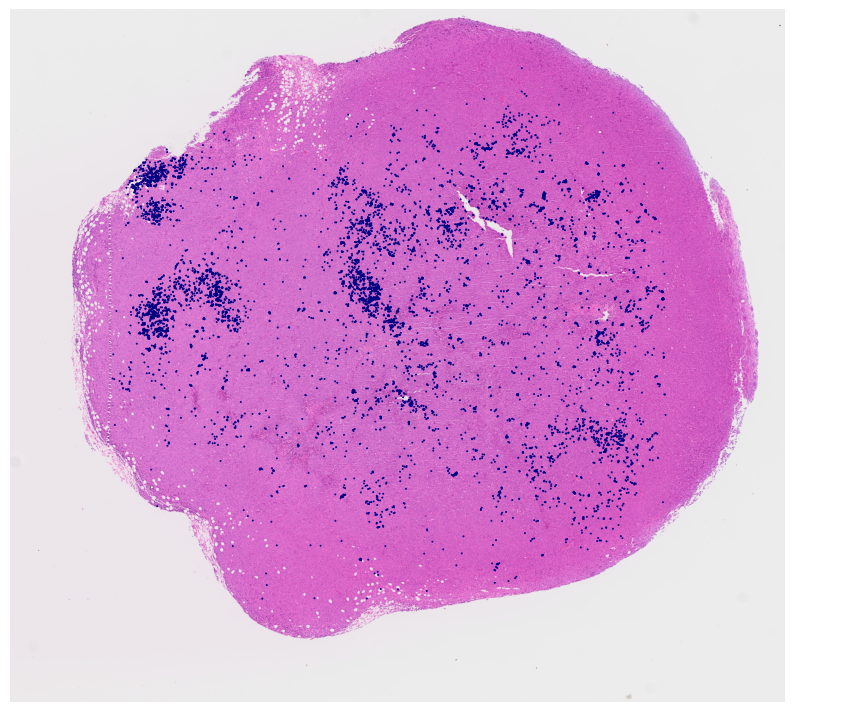

In [16]:
mask = gdata.X.toarray().sum(axis=1) > 0
plot_data = gdata[mask, :].copy()

_, ax = plt.subplots(figsize=(10, 10))
image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped)

colors = plt.cm.jet(np.linspace(0, 1, 200))

sns.scatterplot(x=plot_data.obsm['spatial'][:, 0] * scale_factors['subq'] - image.shape[1] // 2,
                y=plot_data.obsm['spatial'][:, 1] * scale_factors['subq'],
                s=plot_data[:, 'sgnon-targeting'].X.toarray().flatten() * 2, color=colors[0])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, ncol=2)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

In [32]:
import squidpy as sq

sq.gr.spatial_neighbors(gdata_16um, coord_type='generic', radius=200, delaunay=False, set_diag=False)

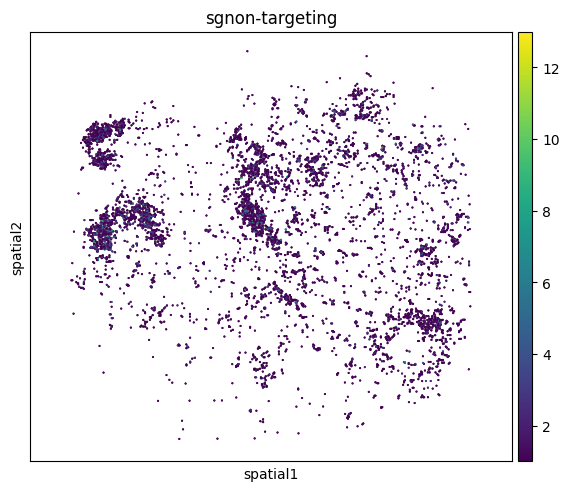

In [33]:
plot_data = gdata_16um[gdata_16um[:, 'sgnon-targeting'].X.toarray().flatten() > 0, :].copy()

sq.pl.spatial_scatter(plot_data, color='sgnon-targeting', size=1, connectivity_key='spatial_connectivities', shape=None, library_id='subq')

In [38]:
sq.gr.spatial_autocorr(gdata_16um, mode='moran', genes=count_df.head(200)['gene'],
                       n_perms=100, n_jobs=10, seed=42)

  0%|          | 0/100 [00:00<?, ?/s]

In [50]:
moran_df = pd.DataFrame(gdata_16um.uns['moranI'])
top_genes = moran_df.sort_values(by='I', ascending=False).head(10).index.tolist()
bottom_genes = moran_df.sort_values(by='I', ascending=True).head(10).index.tolist()

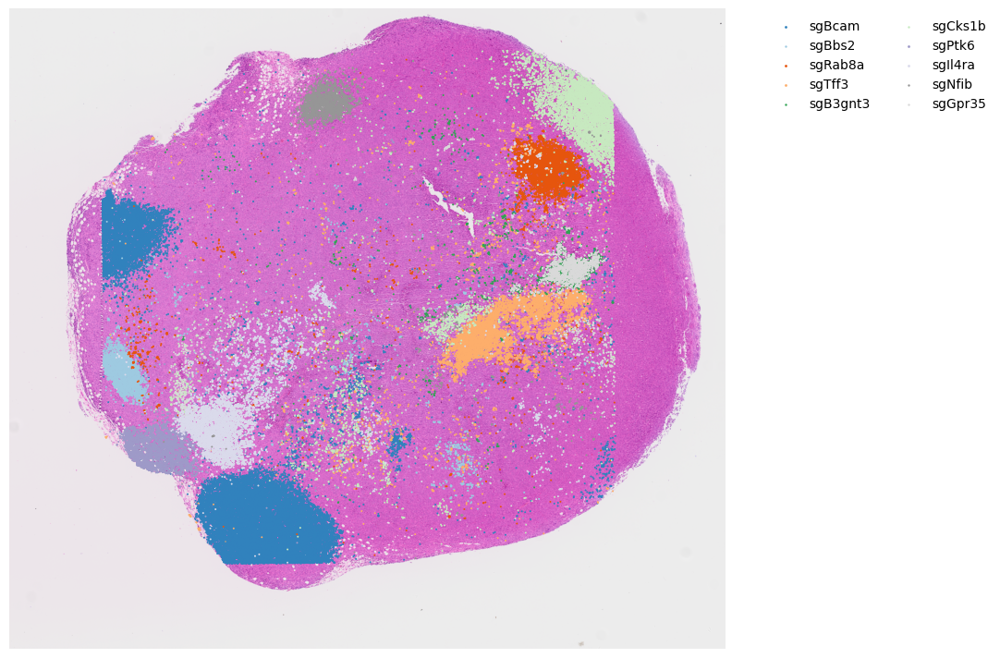

In [194]:
top_genes = ['sgBcam', 'sgBbs2', '']

mask = gdata.X.toarray().sum(axis=1) > 0
plot_data = gdata[mask, :].copy()

_, ax = plt.subplots(figsize=(10, 10))
image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped)

colors = plt.cm.tab20c(np.linspace(0, 1, 10))

for i, gene in enumerate(top_genes):
    sns.scatterplot(x=plot_data.obsm['spatial'][:, 0] * scale_factors['subq'] - image.shape[1] // 2,
                    y=plot_data.obsm['spatial'][:, 1] * scale_factors['subq'],
                    s=plot_data[:, gene].X.toarray().flatten() * 2, color=colors[i], label=gene)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, ncol=2)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)

plt.savefig('./plots/top_moran_clone.pdf', dpi=300, bbox_inches='tight', format='pdf')
plt.show()

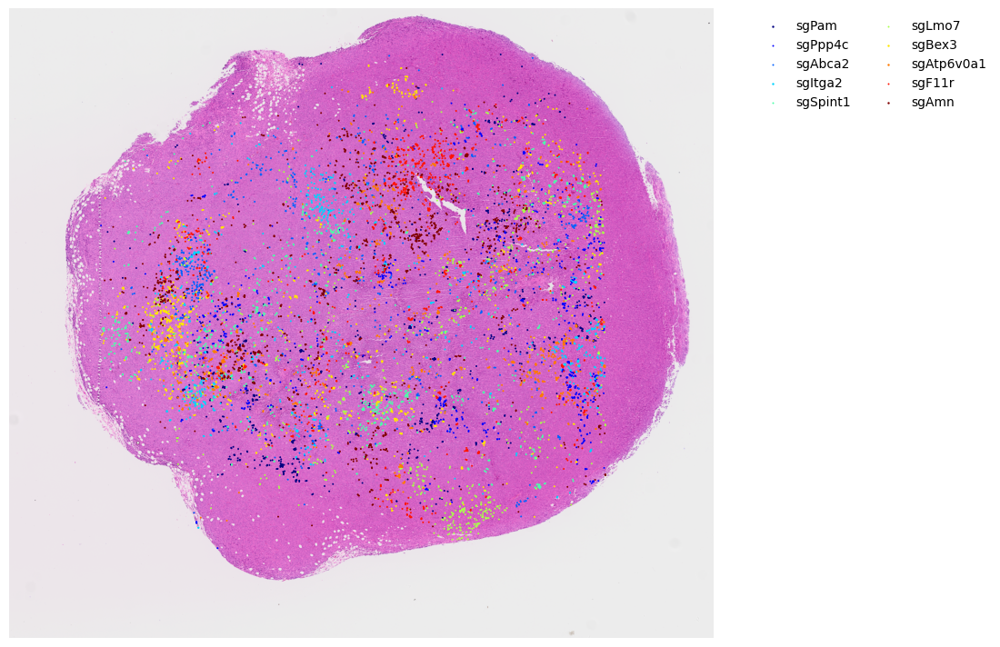

In [53]:
mask = gdata.X.toarray().sum(axis=1) > 0
plot_data = gdata[mask, :].copy()

_, ax = plt.subplots(figsize=(10, 10))
image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped)

colors = plt.cm.jet(np.linspace(0, 1, 10))

for i, gene in enumerate(bottom_genes):
    sns.scatterplot(x=plot_data.obsm['spatial'][:, 0] * scale_factors['subq'] - image.shape[1] // 2,
                    y=plot_data.obsm['spatial'][:, 1] * scale_factors['subq'],
                    s=plot_data[:, gene].X.toarray().flatten() * 2, color=colors[i], label=gene)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, ncol=2)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

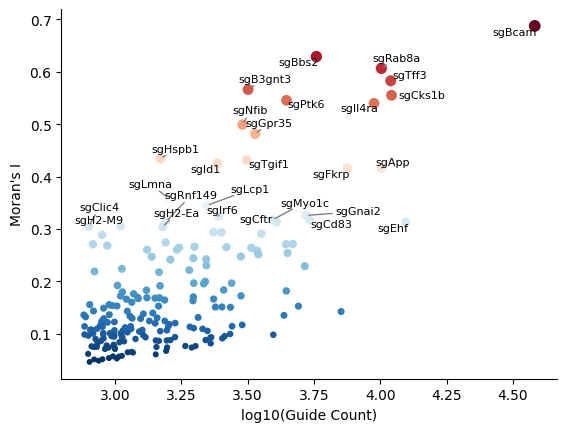

In [77]:
df = pd.concat([count_df.head(200).set_index('gene'), moran_df['I']], axis=1).sort_values(by='I', ascending=False)
df['count'] = np.log10(df['count'])
sns.scatterplot(x='count', y='I', data=df, hue='I', size='I',
                size_order=df.sort_values(by='I', ascending=False).index.tolist(),
                palette='RdBu_r', edgecolor='none', legend=False)
texts = []
for i, gene in enumerate(df.index):
    if df.loc[gene, 'I'] > 0.3:
        texts.append(plt.text(df.loc[gene, 'count'], df.loc[gene, 'I'], gene,
                              fontsize=8, ha='center', va='center'))
import adjustText
adjustText.adjust_text(texts, df['count'], df['I'], arrowprops=dict(arrowstyle='-', color='gray'))
sns.despine(left=False, bottom=False)
plt.xlabel('log10(Guide Count)')
plt.ylabel('Moran\'s I')
plt.show()

# Bin to 100

In [104]:
gdata_16um.obs['array_row_100'] = gdata_16um.obsm['spatial'][:, 0] // 200 * 200
gdata_16um.obs['array_col_100'] = gdata_16um.obsm['spatial'][:, 1] // 200 * 200

gdata_16um_bin = pd.concat([pd.DataFrame(gdata_16um.X.toarray(), index=gdata_16um.obs_names),
                           gdata_16um.obs[['array_row_100', 'array_col_100']]], axis=1)
gdata_16um_bin = gdata_16um_bin.groupby(['array_row_100', 'array_col_100']).sum().reset_index()

In [105]:
from scipy.stats import entropy
gdata_16um_bin.columns = gdata_16um_bin.columns.astype(str)
gdata_16um_bin['entropy'] = entropy(gdata_16um_bin.iloc[:, ~gdata_16um_bin.columns.str.startswith('array')].values, axis=1)
gdata_16um_bin

,array_row_100,array_col_100,0,1,2,3,4,5,6,7,...,727,728,729,730,731,732,733,734,735,entropy
0,38800.0,8000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,38800.0,8200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,38800.0,8400.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,38800.0,8600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,38800.0,8800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13725,63400.0,22000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.180946
13726,63400.0,22200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.840749
13727,63400.0,22400.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.906155
13728,63400.0,22600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.639706


<Figure size 500x500 with 0 Axes>

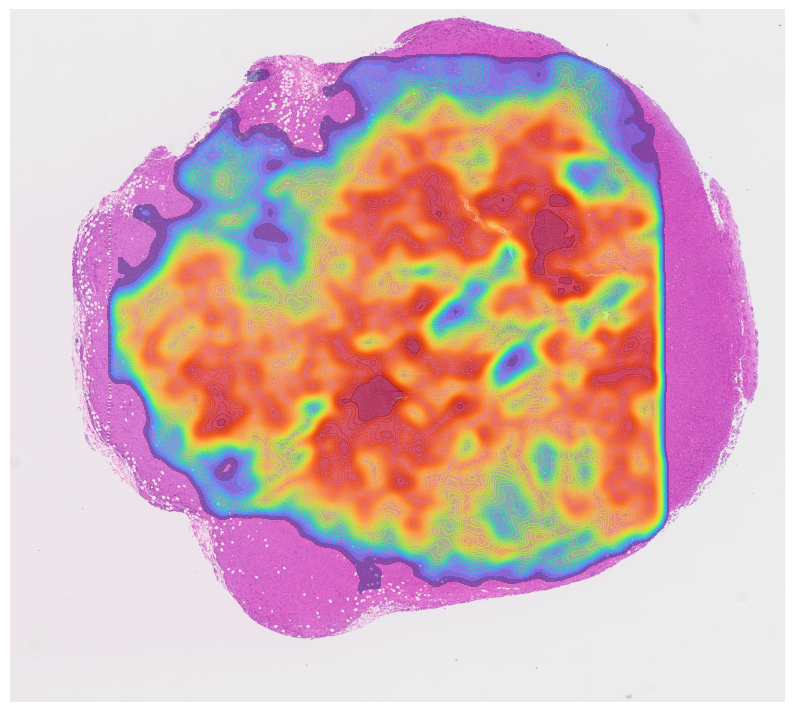

In [180]:
plt.figure(figsize=(5, 5))
_, ax = plt.subplots(figsize=(10, 10))
image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped, cmap='gray')  # 只展示灰度
sns.kdeplot(x=gdata_16um_bin['array_row_100'] * scale_factors['subq'] - image.shape[1] // 2,
            y=gdata_16um_bin['array_col_100'] * scale_factors['subq'],
            weights=gdata_16um_bin['entropy'], fill=True, bw_adjust=0.2, cmap='turbo', levels=50, alpha=0.5)
sns.despine(left=True, bottom=True)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])

plt.savefig('entropy_kde.pdf', dpi=300, bbox_inches='tight', format='pdf')
plt.show()

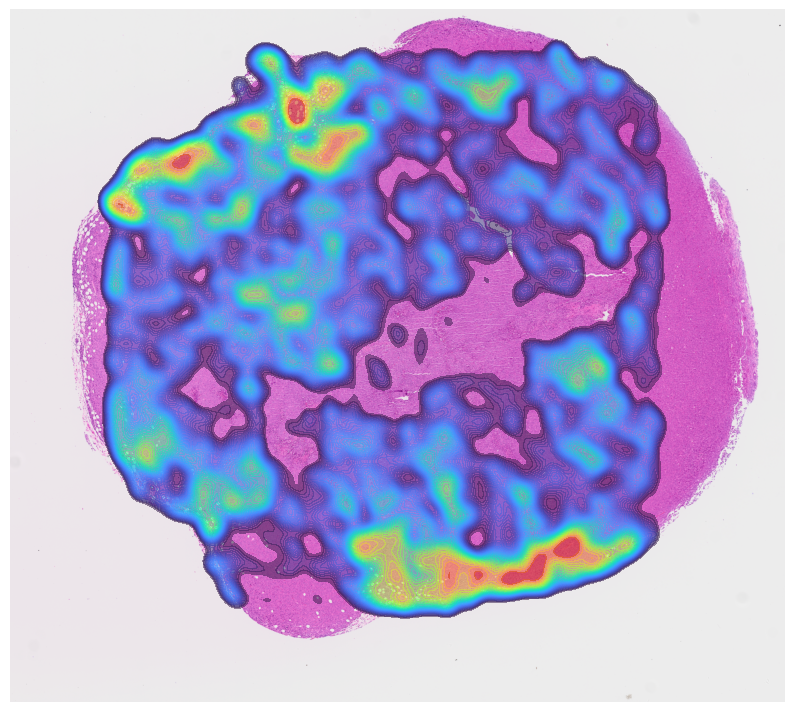

In [190]:
_, ax = plt.subplots(figsize=(10, 10))
image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped, cmap='gray')  # 只展示灰度
sns.kdeplot(x=fdata_16um_bin['array_row_100'] * scale_factors['subq'] - image.shape[1] // 2,
            y=fdata_16um_bin['array_col_100'] * scale_factors['subq'],
            weights=fdata_bin100[:, 'Cd3e'].X.toarray().sum(axis=1), fill=True, bw_adjust=0.2, cmap='turbo', levels=50, alpha=0.5)

sns.despine(left=True, bottom=True)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
plt.show()

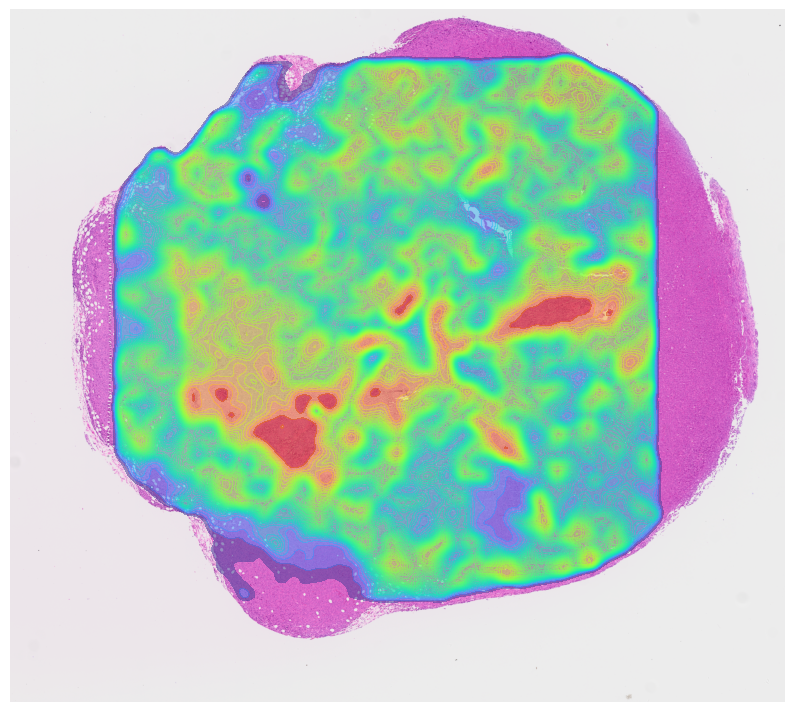

In [195]:
_, ax = plt.subplots(figsize=(10, 10))
image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped, cmap='gray')  # 只展示灰度
sns.kdeplot(x=fdata_16um_bin['array_row_100'] * scale_factors['subq'] - image.shape[1] // 2,
            y=fdata_16um_bin['array_col_100'] * scale_factors['subq'],
            weights=fdata_bin100[:, 'B2m'].X.toarray().sum(axis=1), fill=True, bw_adjust=0.2, cmap='turbo', levels=50, alpha=0.5)

sns.despine(left=True, bottom=True)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
plt.show()

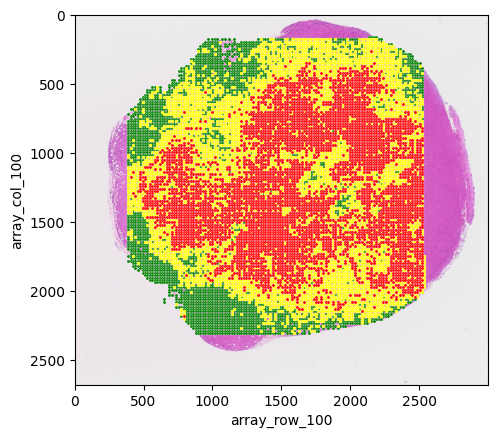

In [123]:
# 拆分gdata_16um_bin得entropy的低中高的位置，分别绘制在spatial图上
gdata_16um_bin['entropy_bin'] = pd.cut(gdata_16um_bin['entropy'], bins=3, labels=['low', 'medium', 'high'])
gdata_16um_bin_low = gdata_16um_bin[gdata_16um_bin['entropy_bin'] == 'low']
gdata_16um_bin_medium = gdata_16um_bin[gdata_16um_bin['entropy_bin'] == 'medium']
gdata_16um_bin_high = gdata_16um_bin[gdata_16um_bin['entropy_bin'] == 'high']

image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped, cmap='gray')  # 只展示灰度
sns.scatterplot(x=gdata_16um_bin_low['array_row_100'] * scale_factors['subq'] - image.shape[1] // 2,
                y=gdata_16um_bin_low['array_col_100'] * scale_factors['subq'],
                s=5, color='green')
sns.scatterplot(x=gdata_16um_bin_medium['array_row_100'] * scale_factors['subq'] - image.shape[1] // 2,
                y=gdata_16um_bin_medium['array_col_100'] * scale_factors['subq'],
                s=5, color='yellow')
sns.scatterplot(x=gdata_16um_bin_high['array_row_100'] * scale_factors['subq'] - image.shape[1] // 2,
                y=gdata_16um_bin_high['array_col_100'] * scale_factors['subq'],
                s=5, color='red')
plt.show()

In [150]:
df = gdata_16um_bin.groupby('entropy_bin').sum().iloc[:, 2:-1]
df.columns = gdata_16um.var_names
print(df.columns[(df.iloc[0, :] > np.sum(df, axis=0) / 3 * 2) & (df.iloc[0, :] > 1000)])
print(df.columns[(df.iloc[1, :] > np.sum(df, axis=0) / 3 * 2) & (df.iloc[1, :] > 1000)])
print(df.columns[(df.iloc[2, :] > np.sum(df, axis=0) / 3 * 2) & (df.iloc[2, :] > 1000)])


Index(['sgBcam', 'sgPtk6', 'sgBbs2'], dtype='object')
Index(['sgRab8a', 'sgTgif1', 'sgB3gnt3', 'sgId1', 'sgLcp1', 'sgIfitm3'], dtype='object')
Index(['sgDaglb', 'sgAmn', 'sgFlna', 'sgH2-M10.6', 'sgH2-Q10', 'sgH2-DMb1',
       'sgH2-DMb2', 'sgSppl2b', 'sgSlc2a3', 'sgAtp2c2', 'sgAtp11a',
       'sgEpb41l2', 'sgGnas', 'sgBlnk', 'sgHnf4a', 'sgAtp13a1', 'sgSdc1',
       'sgErrfi1', 'sgSlc2a1', 'sgCreb1', 'sgSlc17a5', 'sgEreg', 'sgDll4',
       'sgLdlr', 'sgSlc43a3', 'sgAcvr1b', 'sgAnk', 'sgAzgp1', 'sgRnf149'],
      dtype='object')


/tmp/ipykernel_10119/2891913843.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = gdata_16um_bin.groupby('entropy_bin').sum().iloc[:, 2:-1]


In [4]:
data_dir = "/data200T/SPACseq/HD/output/subq/outs/binned_outputs/square_008um/"
fdata_16um = sc.read_h5ad(data_dir + 'combined.h5ad')

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [5]:
mag_genes = ["Mki67", "Epcam", "Top2a", "Ascl2", "Cbx3", "Hsp90ab1", "Zfas1", "Pabpc1", "Gtf3a", "Nap1l1", "Tgfbi", "Ifitm3", "Hspd1", "Nono", "Hsph1", "Nkd1", "Ly6e", "C6orf48", "Ssb", "Rsl1d1", "Dpep1", "Dkc1", "Bmp4", "Gng4", "Cpne1", "Zdhhc9", "Dars", "Scd", "Myc", "Phlda1", "Dach1", "Cldn1", "Krt23"]
mag_genes = np.intersect1d(mag_genes, fdata_16um.var_names)

In [22]:
fdata_16um.var_names_make_unique()

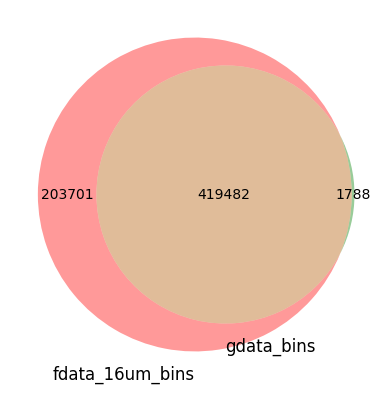

In [28]:
fdata_16um_bins = fdata_16um[fdata_16um[:, mag_genes].X.toarray().sum(axis=1) > 0, :].obs_names.tolist()
gdata_bins = fdata_16um[fdata_16um[:, fdata_16um.var_names.str.startswith('sg')].X.toarray().sum(axis=1) > 0, :].obs_names.tolist()
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

venn2([set(fdata_16um_bins), set(gdata_bins)], ('fdata_16um_bins', 'gdata_bins'))

plt.rcParams['pdf.fonttype'] = 42
plt.savefig('./plots/venn.pdf', dpi=300, bbox_inches='tight', format='pdf')
plt.show()

In [155]:
fdata_16um.obs['array_row_100'] = fdata_16um.obsm['spatial'][:, 0] // 200 * 200
fdata_16um.obs['array_col_100'] = fdata_16um.obsm['spatial'][:, 1] // 200 * 200

fdata_16um_bin = pd.concat([pd.DataFrame(fdata_16um.X.toarray(), index=fdata_16um.obs_names),
                           fdata_16um.obs[['array_row_100', 'array_col_100']]], axis=1)
fdata_16um_bin = fdata_16um_bin.groupby(['array_row_100', 'array_col_100']).sum().reset_index()

In [158]:
fdata_16um_bin.to_csv(data_dir + 'combined_bin.csv', index=False)

In [161]:
fdata_16um_bin.columns = fdata_16um_bin.columns.astype(str)

In [162]:
fdata_bin100 = sc.AnnData(X=np.array(fdata_16um_bin.iloc[:, ~fdata_16um_bin.columns.str.startswith('array')]),
                           obs=fdata_16um_bin[['array_row_100', 'array_col_100']],
                           var=pd.DataFrame(index=fdata_16um.var_names))
fdata_bin100.write_h5ad(data_dir + 'combined_bin100.h5ad')

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [172]:
fdata_bin100.obs['entropy'] = gdata_16um_bin['entropy'].tolist()
fdata_bin100.obs['entropy_bin'] = gdata_16um_bin['entropy_bin'].tolist()

In [174]:
fdata_bin100.write_h5ad(data_dir + 'combined_bin100.h5ad')

In [176]:
fdata_bin100 = fdata_bin100[:, ~fdata_bin100.var_names.str.startswith('sg')]
sc.pp.normalize_total(fdata_bin100, target_sum=1e4)
sc.pp.log1p(fdata_bin100)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [177]:
sc.tl.rank_genes_groups(fdata_bin100, groupby='entropy_bin', method='t-test')

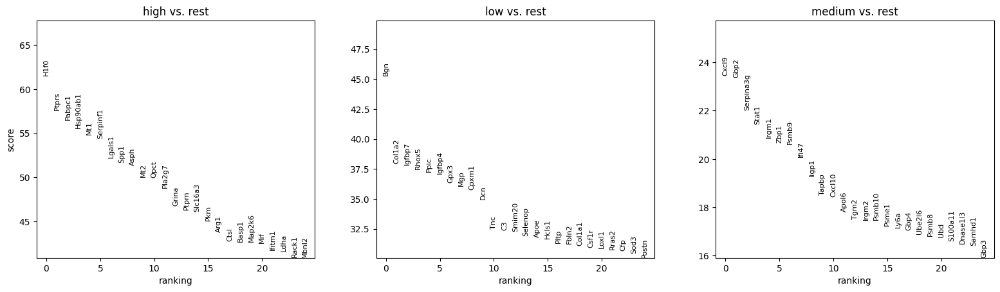

In [179]:
sc.pl.rank_genes_groups_heatmap(fdata_bin100, n_genes=25, cmap='RdBu_r')

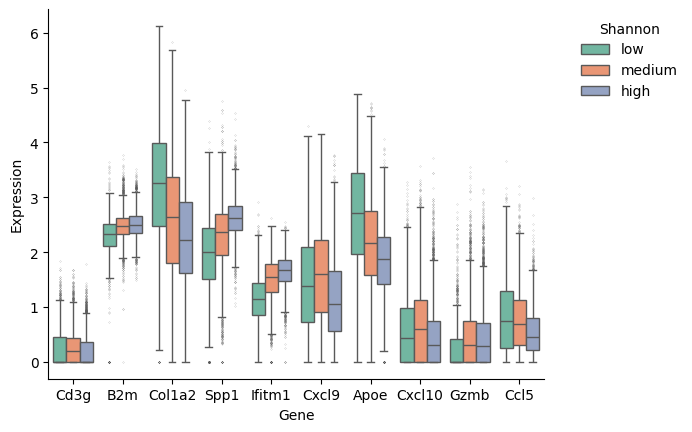

In [252]:
expr_df = pd.DataFrame({
    'shannon': fdata_bin100.obs['entropy_bin'].tolist(),
    'Cd3g': fdata_bin100[:, 'Cd3g'].X.toarray().flatten(),
    'B2m': fdata_bin100[:, 'B2m'].X.toarray().flatten(),
    'Col1a2': fdata_bin100[:, 'Col1a1'].X.toarray().flatten(),
    'Spp1': fdata_bin100[:, 'Spp1'].X.toarray().flatten(),
    'Ifitm1': fdata_bin100[:, 'Ifitm1'].X.toarray().flatten(),
    'Cxcl9': fdata_bin100[:, 'Cxcl9'].X.toarray().flatten(),
    'Apoe': fdata_bin100[:, 'Apoe'].X.toarray().flatten(),
    'Cxcl10': fdata_bin100[:, 'Cxcl10'].X.toarray().flatten(),
    'Gzmb': fdata_bin100[:, 'Gzmb'].X.toarray().flatten(),
    'Ccl5': fdata_bin100[:, 'Ccl5'].X.toarray().flatten(),
}).set_index('shannon').melt(ignore_index=False).reset_index()
sns.boxplot(x='variable', y='value', data=expr_df, hue='shannon', fliersize=0.1, palette='Set2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, ncol=1, title='Shannon')
plt.xlabel('Gene')
plt.ylabel('Expression')
sns.despine(left=False, bottom=False)
plt.show()

In [224]:
sing_data

,array_row_100,array_col_100,0,1,2,3,4,5,6,7,...,728,729,730,731,732,733,734,735,entropy,entropy_bin
1,38800.0,8200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,low
4,38800.0,8800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,low
5,38800.0,9000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,low
6,38800.0,9200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.745210,low
7,38800.0,9400.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.431542,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13632,63200.0,6600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.136068,low
13633,63200.0,6800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.917402,low
13637,63200.0,7600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.042785,low
13638,63200.0,7800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.796312,low


In [238]:
sing_data = gdata_16um_bin.loc[gdata_16um_bin['entropy_bin'] == 'low', :]
sing_data['guide'] = gdata_16um.var_names[np.argmax(sing_data.iloc[:, 2:-2].values, axis=1)]
plot_genes = sing_data['guide'].sort_values().value_counts()[sing_data['guide'].sort_values().value_counts() > 50].index.tolist()

/tmp/ipykernel_10119/719323441.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sing_data['guide'] = gdata_16um.var_names[np.argmax(sing_data.iloc[:, 2:-2].values, axis=1)]


In [242]:
plot_data

,array_row_100,array_col_100,0,1,2,3,4,5,6,7,...,729,730,731,732,733,734,735,entropy,entropy_bin,guide
1,38800.0,8200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,low,sgBcam
5,38800.0,9000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,low,sgBcam
6,38800.0,9200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.745210,low,sgBcam
7,38800.0,9400.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.431542,low,sgBcam
8,38800.0,9600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.570391,low,sgBcam
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13630,63200.0,6200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.707786,low,sgCks1b
13631,63200.0,6400.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.032400,low,sgCks1b
13632,63200.0,6600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.136068,low,sgCks1b
13633,63200.0,6800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.917402,low,sgCks1b


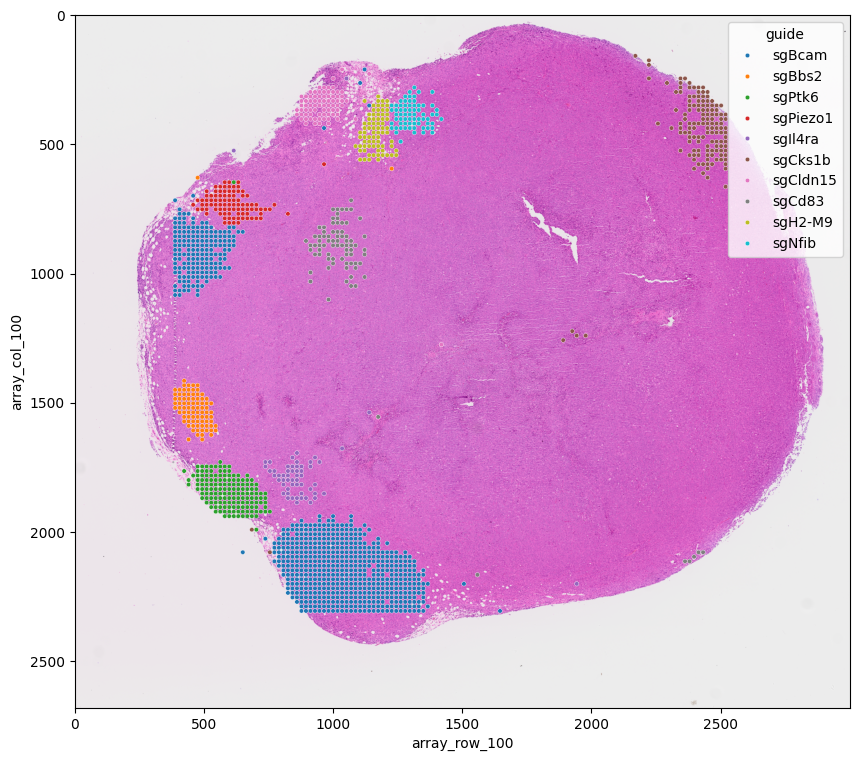

In [244]:
plot_data = sing_data.loc[sing_data['guide'].isin(plot_genes), :]

_, ax = plt.subplots(figsize=(10, 10))
image_cropped = image[:, image.shape[1] // 2:]  # 裁剪图像，只保留右半部分
plt.imshow(image_cropped)
sns.scatterplot(x=plot_data['array_row_100'] * scale_factors['subq'] - image.shape[1] // 2,
                y=plot_data['array_col_100'] * scale_factors['subq'],
                s=10, hue=plot_data['guide'])
plt.show()

/tmp/ipykernel_10119/3681713061.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  clone_data.obs['guide'] = sing_data.guide.tolist()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make the

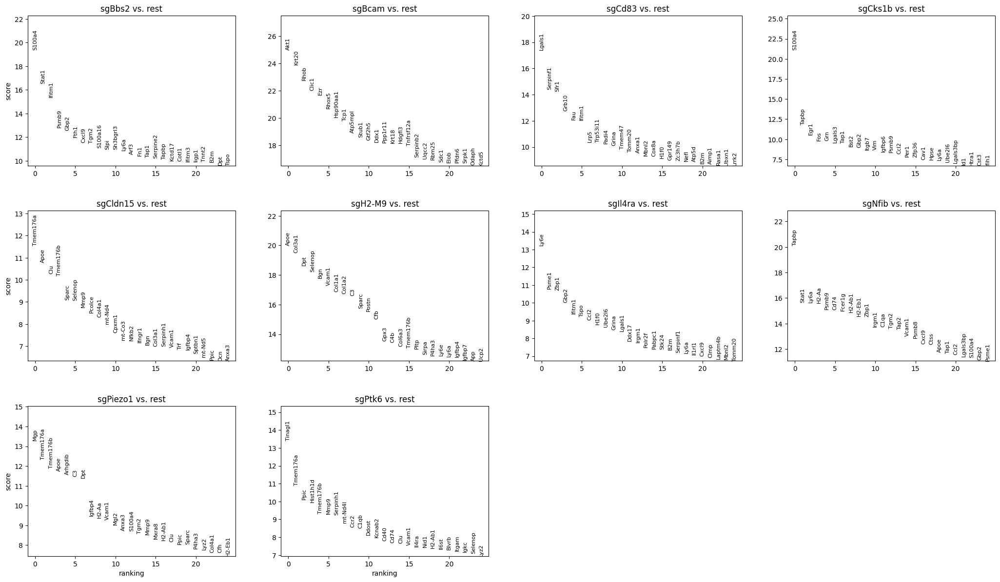

In [251]:
clone_data = fdata_bin100[fdata_bin100.obs['entropy_bin'] == 'low', :]
clone_data.obs['guide'] = sing_data.guide.tolist()

clone_data = clone_data[clone_data.obs['guide'].isin(plot_genes)]

sc.tl.rank_genes_groups(clone_data, groupby='guide', method='t-test')
sc.pl.rank_genes_groups(clone_data, n_genes=25, sharey=False)

100%|██████████| 50/50 [00:00<00:00, 394.96it/s]


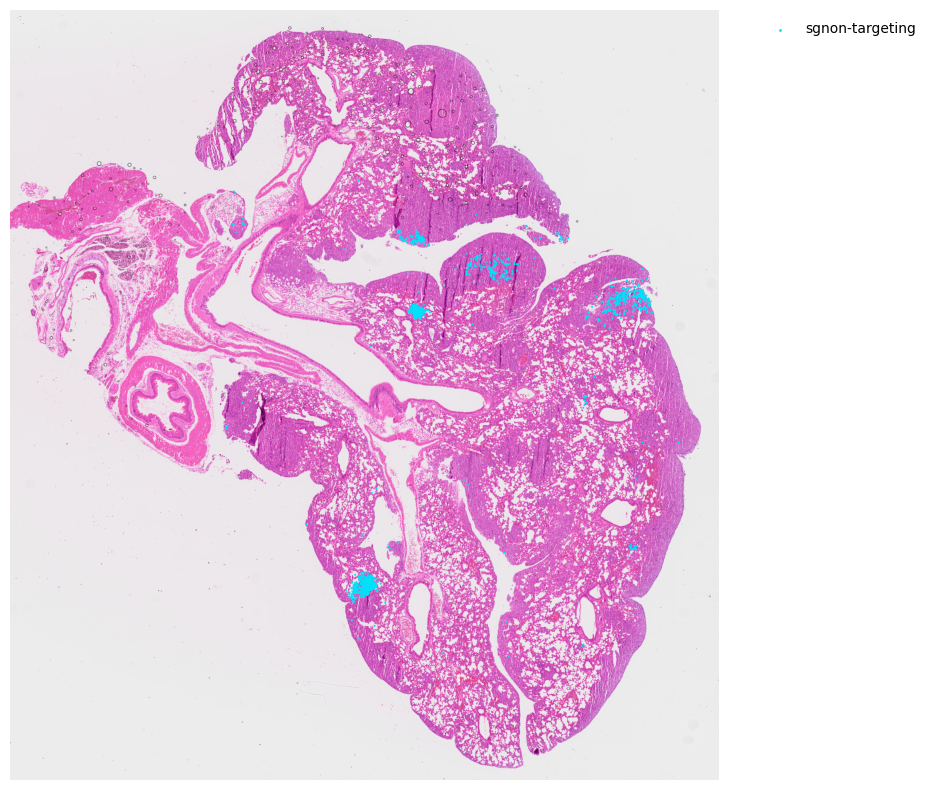

In [32]:
mask = gdata[:, count_df.head(50)['gene']].X.toarray().sum(axis=1) > 0
plot_data = gdata[mask, :].copy()

_, ax = plt.subplots(figsize=(10, 10))
colors = plt.cm.jet(np.linspace(0, 1, 50))
plt.imshow(image)

for i, gene in enumerate(tqdm(count_df.head(50)['gene'])):
    if gene != 'sgnon-targeting':
        continue
    sns.scatterplot(x=plot_data.obsm['spatial'][:, 0] * scale_factors['subq'], y=plot_data.obsm['spatial'][:, 1] * scale_factors['subq'],
                    s=plot_data[:, gene].X.toarray().flatten() * 2, color=colors[i], label=gene)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, ncol=2)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()